# Evaluation

After modeling, we raise the question where our models tend to systematic errors. This might help us to further improve our model (e.g., by Feature Engineering).

Especially interesting are systematic errors between "False Positive" and "True Negative" on one hand, and "False Negative" and "True Positive" on the other.

In [13]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import os

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

import warnings
warnings.filterwarnings("ignore")

In [14]:
# read the dataframes with prediction outcome from last notebook 
df_train_eval = pd.read_pickle('./data/eval/df_train_eval.pkl')
df_test_eval = pd.read_pickle('./data/eval/df_test_eval.pkl')

In [15]:
# create a column that contains the classification outcome

def classification_evaluation(row):
    '''input: row of a dataframe
    output: classification outcome based on y_pred'''
    if row['churn_risk_score'] == 1 and row['y_pred'] == 1:
        return 'TruePositive'
    elif row['churn_risk_score'] == 0 and row['y_pred'] == 0:
        return 'TrueNegative'
    elif row['churn_risk_score'] == 1 and row['y_pred'] == 0:
        return 'FalseNegative'
    elif row['churn_risk_score'] == 0 and row['y_pred'] == 1:
        return 'FalsePositive'

df_train_eval['classification_outcomes'] = df_train_eval.apply(classification_evaluation, axis=1)


In [16]:
df_train_eval.head(20)

,age,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,last_visit_time_hours,days_since_join,gender_M,gender_Unknown,region_category_Town,...,feedback_Products always in Stock,feedback_Quality Customer Care,feedback_Reasonable Price,feedback_Too many ads,feedback_User Friendly Website,membership_category,days_since_last_login,churn_risk_score,y_pred,classification_outcomes
0,0.753125,0.819790,-0.498559,7.988110e-01,-0.467839,-0.654670,-1.466650,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,1.0,2.0,1.0,1,TruePositive
1,0.312482,2.951506,0.984050,1.141198e+00,0.072138,-0.077269,-0.869147,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5.0,16.0,0.0,0,TrueNegative
2,-1.575985,0.002486,3.386387,-4.566063e-01,-0.007844,0.500131,-0.416303,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,4.0,9.0,0.0,0,TrueNegative
3,-0.568803,0.161478,0.832711,2.388238e+00,0.154765,-0.221619,0.571148,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,3.0,14.0,1.0,0,FalseNegative
4,1.634410,-0.524962,-1.292708,2.874265e+00,-0.286663,-0.510320,-1.447781,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,18.0,1.0,1,TruePositive
5,1.319665,-0.533415,0.791700,5.705533e-01,-0.397209,1.510582,-0.406869,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,3.0,1.0,1,TruePositive
6,-0.694700,-0.323154,-0.145976,-1.027251e+00,0.341804,-0.510320,0.417056,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,4.0,2.0,0.0,0,TrueNegative
7,1.004921,-0.426764,-0.756129,-1.142197e-01,0.143414,-1.665121,1.492560,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,19.0,1.0,1,TruePositive
8,1.571461,-0.529949,2.637583,-1.142197e-01,0.459934,0.644482,0.036541,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,4.0,14.0,0.0,0,TrueNegative
9,-0.505854,-0.531345,-0.075927,1.140379e-01,-0.311032,0.933182,0.090001,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,13.0,1.0,1,TruePositive


In [21]:
num_features = ["age", "avg_time_spent", "avg_transaction_value", "avg_frequency_login_days", "points_in_wallet", "last_visit_time_hours", "days_since_join", "days_since_last_login","classification_outcomes"]


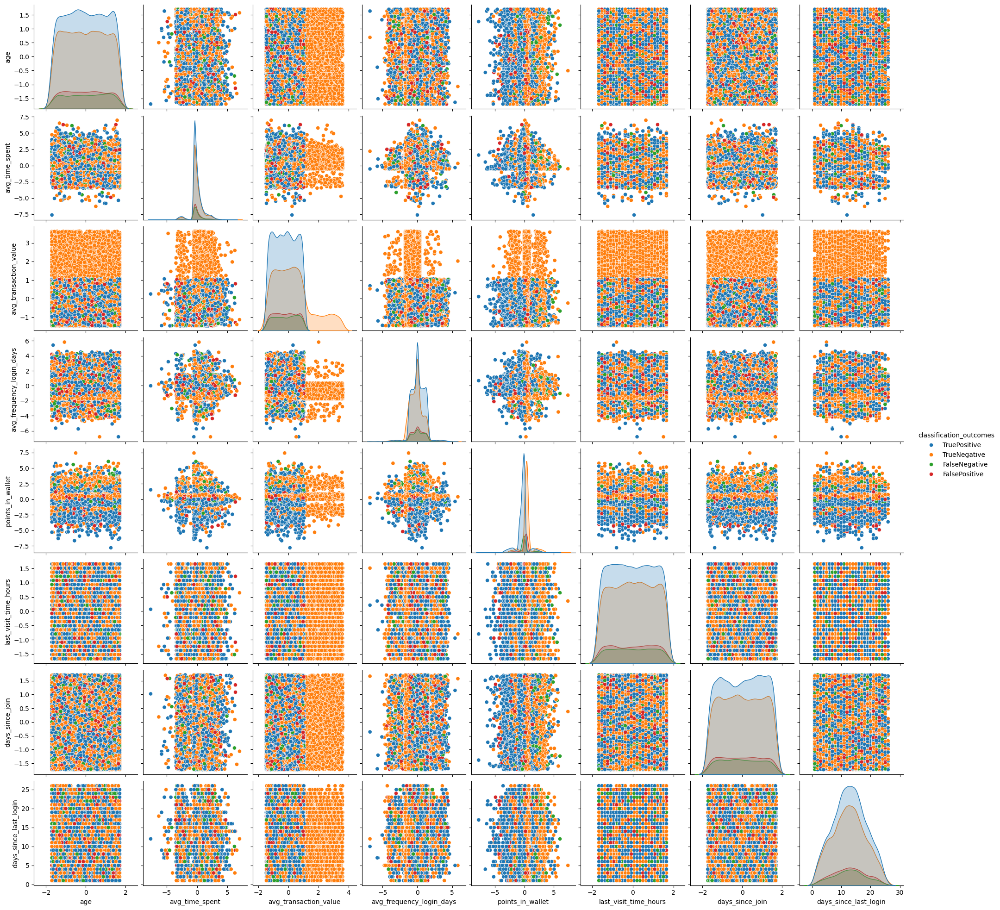

In [22]:
sns.pairplot(df_train_eval[num_features], hue='classification_outcomes')

Undersampling to get a balanced relative view for each classification outcome

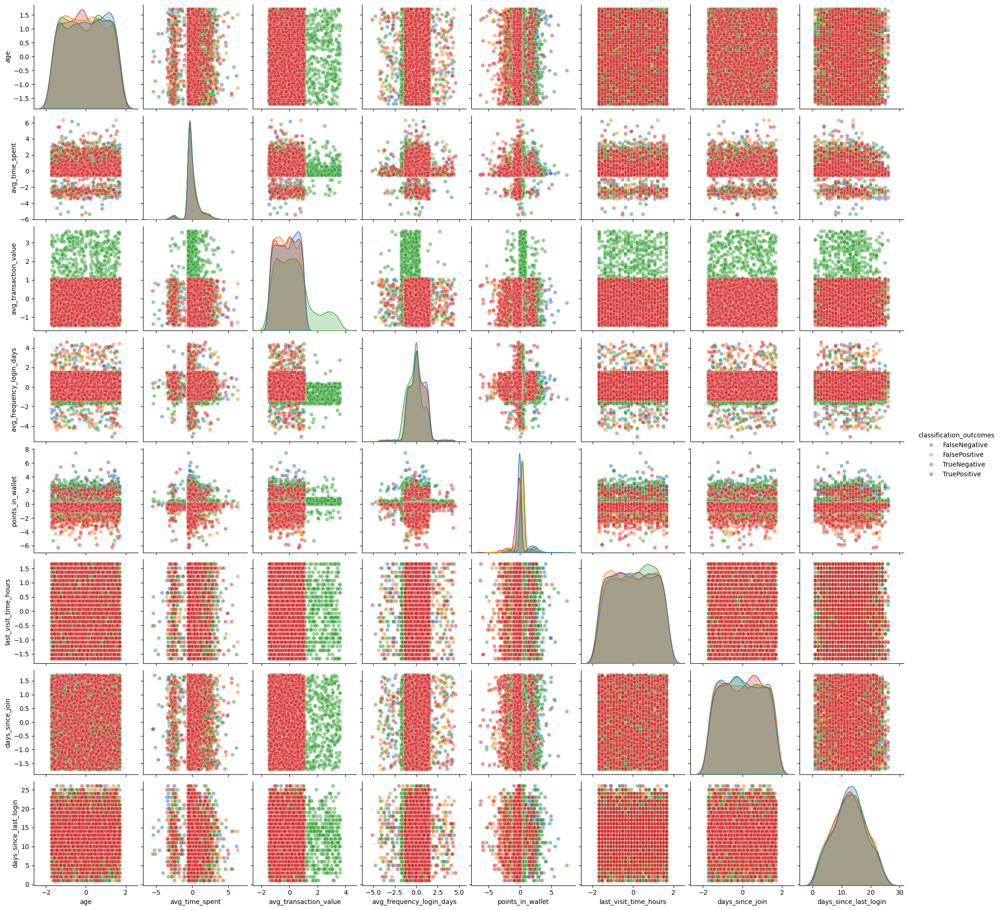

In [28]:
# Count the occurrences of each category
category_counts = df_train_eval['classification_outcomes'].value_counts()

# Determine the minimum count among categories
min_count = category_counts.min()

# Group the DataFrame by the category
grouped = df_train_eval.groupby('classification_outcomes')

# Sample each group to get a balanced DataFrame
balanced_df = grouped.apply(lambda x: x.sample(min_count))

# Reset index of the resulting DataFrame
balanced_df = balanced_df.reset_index(drop=True)

#plot balanced df
sns.pairplot(balanced_df[num_features], hue='classification_outcomes', plot_kws=dict(alpha=0.5))

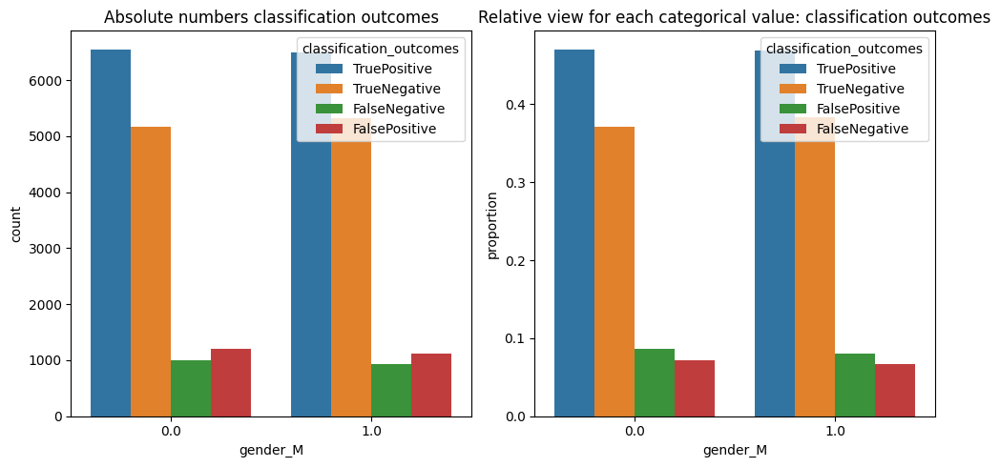

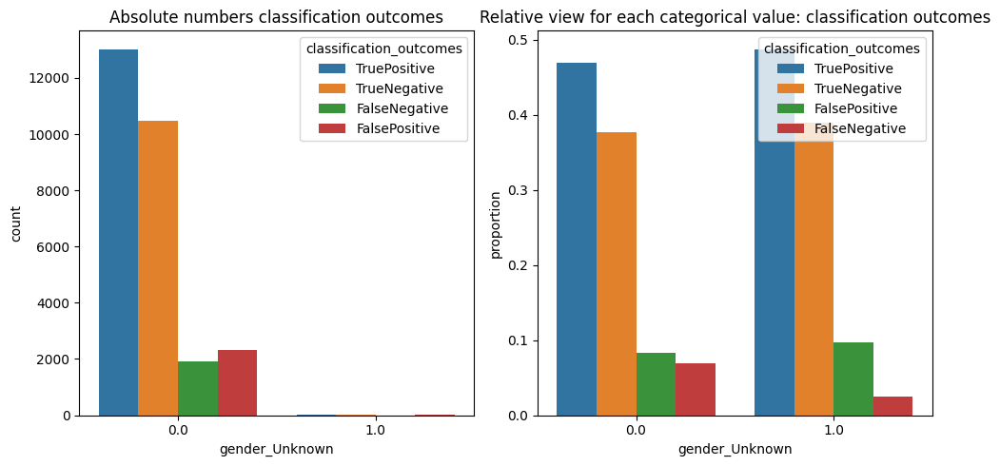

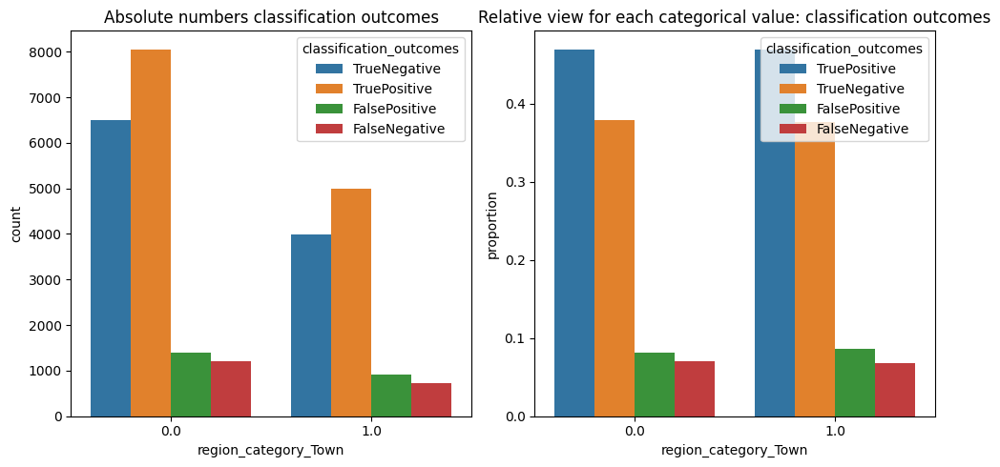

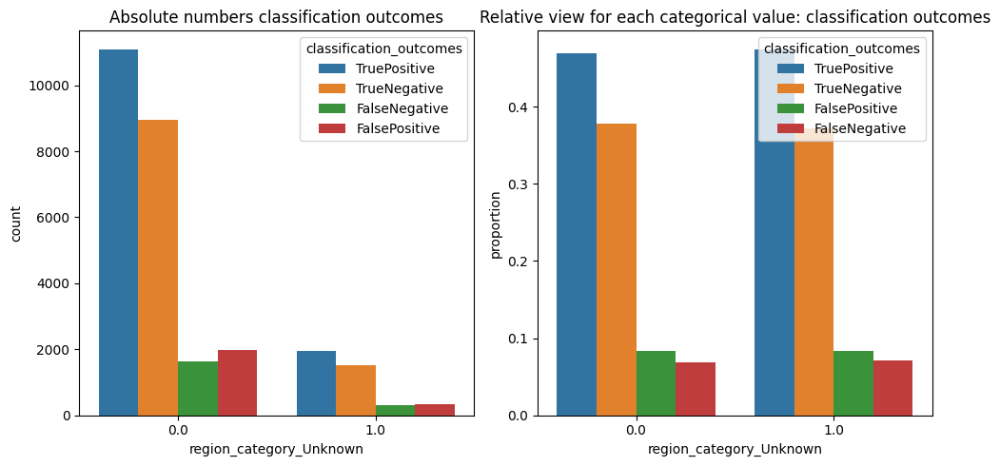

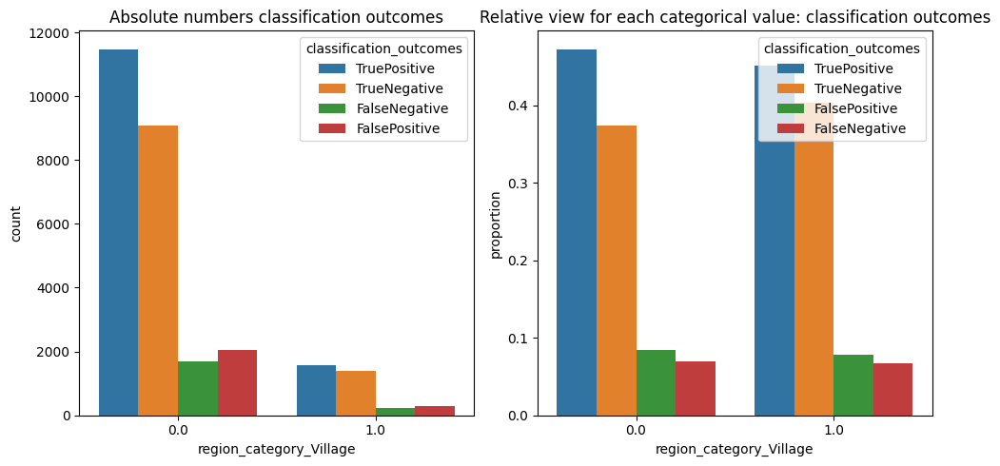

...

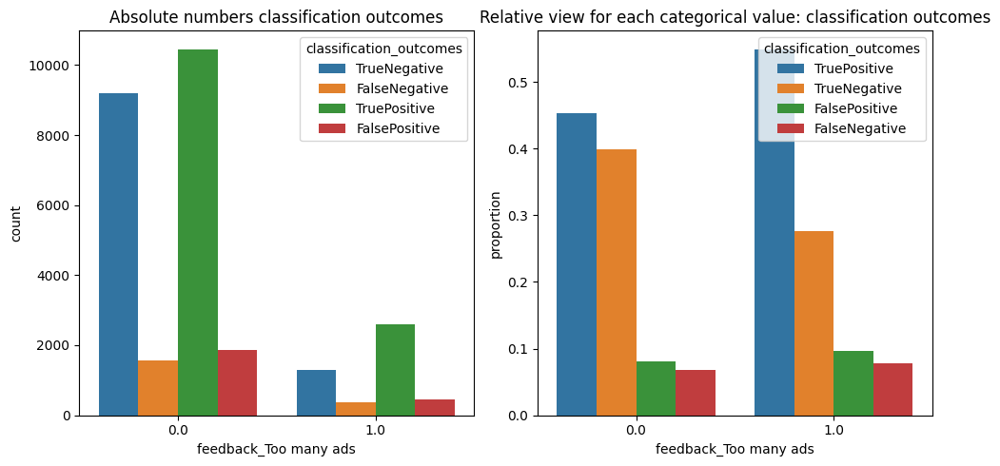

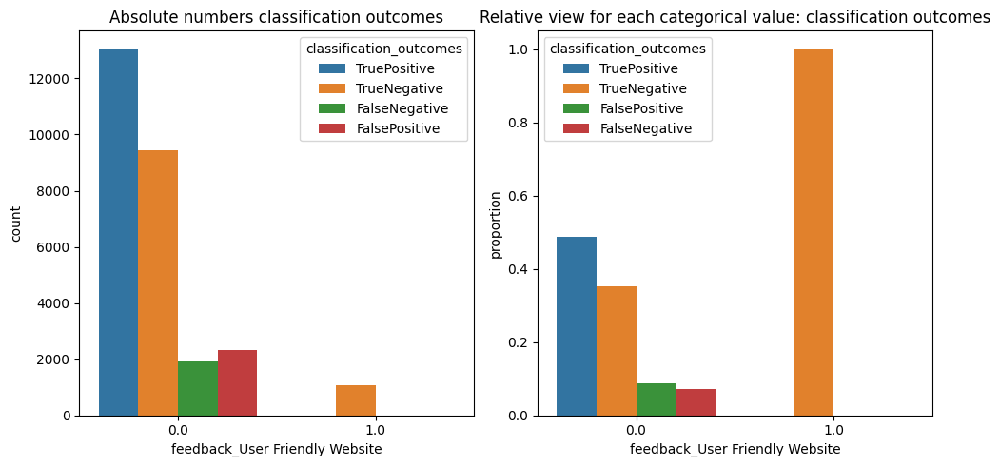

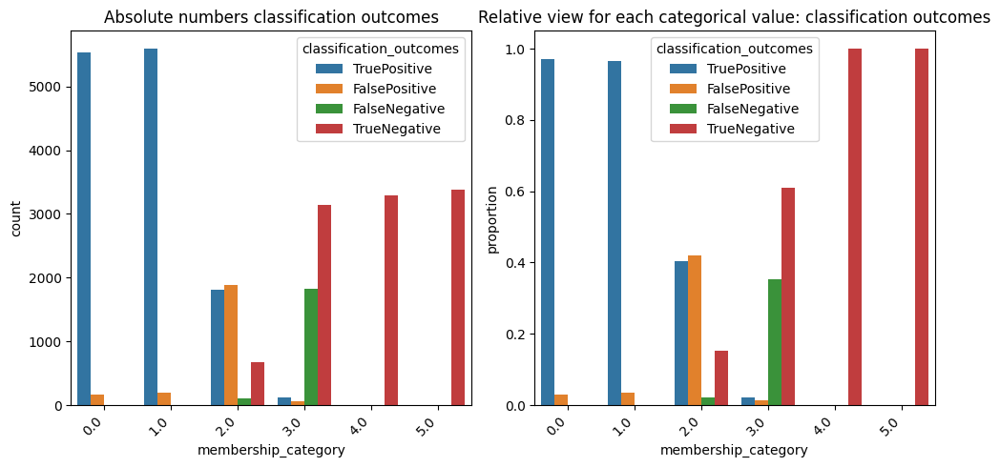

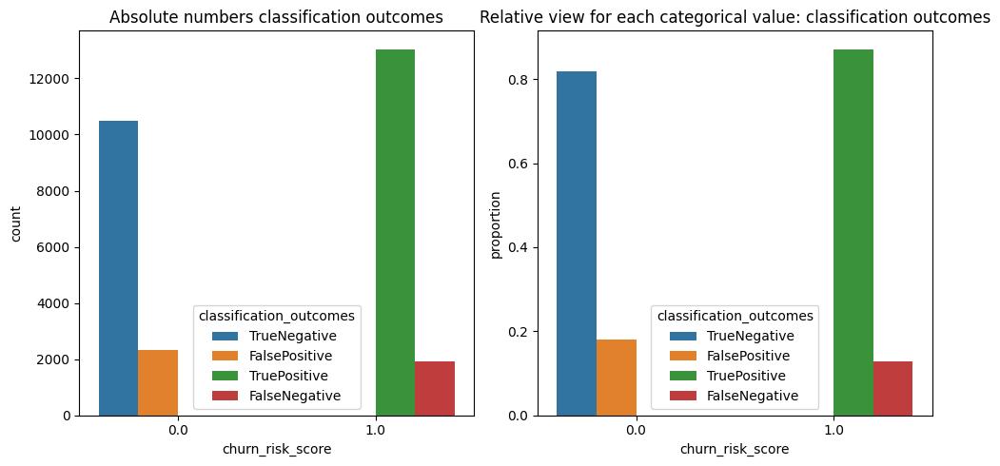

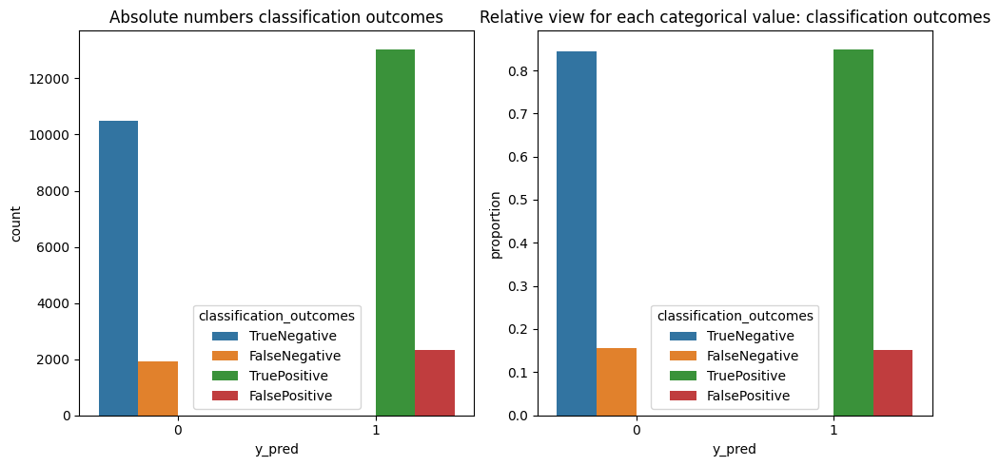

In [24]:
df_train_eval_categorical = df_train_eval.drop(num_features, axis = 1)
for plot in df_train_eval_categorical.columns:
    #absolute
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    sns.countplot(df_train_eval, x = plot, hue = 'classification_outcomes', ax=axes[0])
    axes[0].set_title('Absolute numbers classification outcomes')

    if df_train_eval[plot].nunique() > 3 or df_train_eval[plot].nunique() > 2 and len(df_train_eval[plot].unique()[0]) > 10:
        axes[0].tick_params(axis='x', rotation=45)
        axes[0].set_xticklabels(axes[0].get_xticklabels(), ha='right')

    #relative
    df_prop = df_train_eval.groupby(plot)['classification_outcomes'].value_counts(normalize=True).rename('proportion').reset_index()
    sns.barplot(data=df_prop, x = plot, y='proportion', hue = 'classification_outcomes', ax = axes[1])
    axes[1].set_title('Relative view for each categorical value: classification outcomes')
    if df_train_eval[plot].nunique() > 3 or df_train_eval[plot].nunique() > 2 and len(df_train_eval[plot].unique()[0]) > 10:
        axes[1].tick_params(axis='x', rotation=45)
        axes[1].set_xticklabels(axes[1].get_xticklabels(), ha='right')

    # Adjust layout
    plt.tight_layout()

    # Show plot
    plt.show()

# Learnings

- if membership_category < 3 --> High tendency to false FP, while membership_category >= 3 tendency to FN
- despite importance of feedback_user_friendly_website (only 1 leads to TN), all outcome categories are at 0
- same for feedback_quality_content, feedback_reasonable_price
- high transaction value important for negative prediction
- high points in wallet might lead to FN

# To Do
- run another model
- reduce modeling to relevant features only and see how the performance looks loke
- not checked yet: interactions of multiple features